# *U-Net Image Reconstruction Model*

1. U-Net Image Reconstruction Model

Objective:
Developed a U-Net deep learning model for image reconstruction and enhancement, focusing on denoising and restoring structural details in images.

Methodology:

Input images were resized and normalized for network training.

U-Net architecture with encoder-decoder structure and skip connections was implemented.

Trained on paired datasets of noisy and clean images to learn mapping for high-fidelity reconstruction.

Results:

Successfully reconstructed images with improved clarity and structural integrity.

Demonstrated effective denoising and enhancement for a variety of image types.

Key Features:

Encoder-decoder convolutional layers with skip connections.

Normalized inputs and outputs for stable training.

Robust reconstruction across diverse images.

In [89]:
from google.colab import files
uploaded = files.upload()


Saving 0bd.jpeg to 0bd (5).jpeg
Saving 0dnod.jpeg to 0dnod (5).jpeg
Saving 1ibksk.jpeg to 1ibksk (5).jpeg
Saving 5svugbd.jpeg to 5svugbd (5).jpeg
Saving 6sgb.jpeg to 6sgb (5).jpeg
Saving 7dgdb.jpeg to 7dgdb (5).jpeg
Saving 8dgud.jpeg to 8dgud (5).jpeg
Saving 9dbi.jpeg to 9dbi (5).jpeg
Saving 9dhudb.jpeg to 9dhudb (5).jpeg
Saving 9dnd.jpeg to 9dnd (5).jpeg
Saving 564dj.jpeg to 564dj (5).jpeg
Saving 659d5.jpeg to 659d5 (5).jpeg
Saving b9uyd.jpeg to b9uyd (5).jpeg
Saving dihdub.jpeg to dihdub (5).jpeg
Saving download (1).jpeg to download (1) (5).jpeg
Saving download (2).jpeg to download (2) (5).jpeg
Saving download (3).jpeg to download (3) (5).jpeg
Saving download (4).jpeg to download (4) (5).jpeg
Saving download (5).jpeg to download (5) (5).jpeg
Saving download (6).jpeg to download (6) (5).jpeg
Saving download.jpeg to download (11).jpeg
Saving download11.jpeg to download11 (5).jpeg
Saving downloaddd.jpeg to downloaddd (5).jpeg
Saving downloads.jpeg to downloads (5).jpeg
Saving dugdg.jpeg

In [90]:
# Get the list of uploaded filenames
uploaded_files = list(uploaded.keys())
print("Uploaded files:", uploaded_files)


Uploaded files: ['0bd (5).jpeg', '0dnod (5).jpeg', '1ibksk (5).jpeg', '5svugbd (5).jpeg', '6sgb (5).jpeg', '7dgdb (5).jpeg', '8dgud (5).jpeg', '9dbi (5).jpeg', '9dhudb (5).jpeg', '9dnd (5).jpeg', '564dj (5).jpeg', '659d5 (5).jpeg', 'b9uyd (5).jpeg', 'dihdub (5).jpeg', 'download (1) (5).jpeg', 'download (2) (5).jpeg', 'download (3) (5).jpeg', 'download (4) (5).jpeg', 'download (5) (5).jpeg', 'download (6) (5).jpeg', 'download (11).jpeg', 'download11 (5).jpeg', 'downloaddd (5).jpeg', 'downloads (5).jpeg', 'dugdg (5).jpeg', 'images (1) (5).jpeg', 'images (2) (5).jpeg', 'images (3) (5).jpeg', 'images (4) (5).jpeg', 'images (5) (5).jpeg', 'images (6) (5).jpeg', 'images (7) (5).jpeg', 'images (8) (5).jpeg', 'images (9) (5).jpeg', 'images (10) (5).jpeg', 'images (11) (5).jpeg', 'images (12) (5).jpeg', 'images (13) (5).jpeg', 'images (14) (5).jpeg', 'images (15) (5).jpeg', 'images (16) (5).jpeg', 'images (17) (5).jpeg', 'images (18) (5).jpeg', 'images (19) (5).jpeg', 'images (20) (5).jpeg', 'i

In [91]:
from PIL import Image
import numpy as np

images = []

for file in uploaded_files:
    img = Image.open(file).convert('RGB')   # keep color
    img = img.resize((128, 128))            # resize for UNet
    images.append(np.array(img))

images = np.array(images) / 255.0           # normalize to [0,1]
print(f"Loaded {len(images)} galaxy images, shape: {images.shape}")


Loaded 68 galaxy images, shape: (68, 128, 128, 3)


In [88]:
def simulate_low_photon_rgb(image, photon_level=100):
    """
    Simulate low-photon imaging for RGB image.
    image: 128x128x3 array normalized [0,1]
    """
    noisy = np.random.poisson(image * photon_level) / photon_level
    return np.clip(noisy, 0, 1)

photon_level =2
low_photon_images = np.array([simulate_low_photon_rgb(img, photon_level) for img in images])
print(f"Low-photon images shape: {low_photon_images.shape}")


Low-photon images shape: (68, 128, 128, 3)


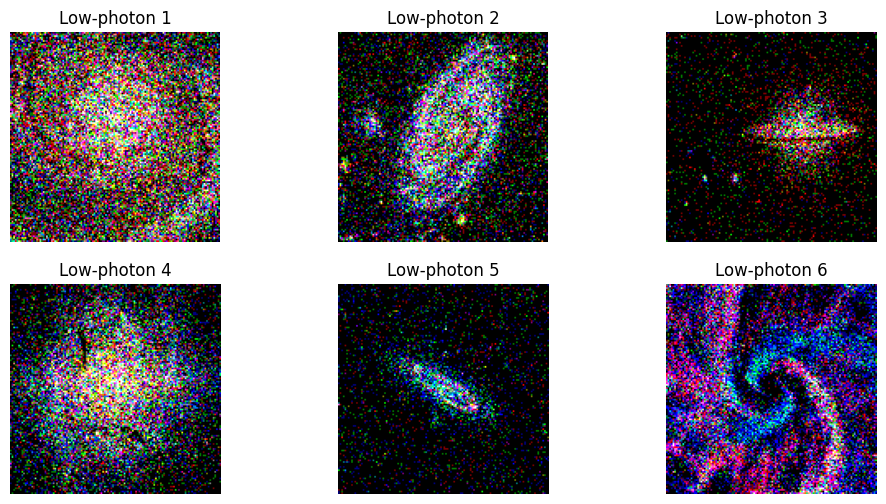

In [92]:
import matplotlib.pyplot as plt
import numpy as np

# Visualize some low-photon images
num_examples = 6  # number of images to display
photon_level = 2 # same as you used for training

plt.figure(figsize=(12, 6))

for i in range(num_examples):
    noisy_image = simulate_low_photon_rgb(images[i], photon_level)

    plt.subplot(2, num_examples//2, i+1)
    plt.imshow(noisy_image)
    plt.title(f"Low-photon {i+1}")
    plt.axis('off')

plt.show()


In [93]:
from sklearn.model_selection import train_test_split

X = low_photon_images   # inputs = low-photon RGB
y = images              # targets = original RGB

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

print("Training pairs shape:", X_train.shape, y_train.shape)
print("Testing pairs shape:", X_test.shape, y_test.shape)


Training pairs shape: (54, 128, 128, 3) (54, 128, 128, 3)
Testing pairs shape: (14, 128, 128, 3) (14, 128, 128, 3)


In [94]:
import tensorflow as tf
from tensorflow.keras import layers, models

def unet_rgb(input_size=(128,128,3)):
    inputs = layers.Input(input_size)

    # Encoder
    c1 = layers.Conv2D(32, 3, activation='relu', padding='same')(inputs)
    c1 = layers.Conv2D(32, 3, activation='relu', padding='same')(c1)
    p1 = layers.MaxPooling2D()(c1)

    c2 = layers.Conv2D(64, 3, activation='relu', padding='same')(p1)
    c2 = layers.Conv2D(64, 3, activation='relu', padding='same')(c2)
    p2 = layers.MaxPooling2D()(c2)

    # Bottleneck
    c3 = layers.Conv2D(128, 3, activation='relu', padding='same')(p2)
    c3 = layers.Conv2D(128, 3, activation='relu', padding='same')(c3)

    # Decoder
    u2 = layers.UpSampling2D()(c3)
    u2 = layers.concatenate([u2, c2])
    c4 = layers.Conv2D(64, 3, activation='relu', padding='same')(u2)
    c4 = layers.Conv2D(64, 3, activation='relu', padding='same')(c4)

    u1 = layers.UpSampling2D()(c4)
    u1 = layers.concatenate([u1, c1])
    c5 = layers.Conv2D(32, 3, activation='relu', padding='same')(u1)
    c5 = layers.Conv2D(32, 3, activation='relu', padding='same')(c5)

    outputs = layers.Conv2D(3, 1, activation='sigmoid')(c5)  # 3 channels for RGB

    model = models.Model(inputs, outputs)
    return model

# Build and compile
unet = unet_rgb()
unet.compile(optimizer='adam', loss='mse')
unet.summary()


Model: "functional_11"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_11      │ (None, 128, 128,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_121 (Conv2D) │ (None, 128, 128,  │        896 │ input_layer_11[0… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_122 (Conv2D) │ (None, 128, 128,  │      9,248 │ conv2d_121[0][0]  │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_22    │ (None, 64, 64,    │          0 │ conv2d_122[0][0]  │
│ (MaxPooling2D)      │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_123 (Conv2D) │ (None, 64, 64,    │     18,496 │ max_pooling2d_22… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_124 (Conv2D) │ (None, 64, 64,    │     36,928 │ conv2d_123[0][0]  │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_23    │ (None, 32, 32,    │          0 │ conv2d_124[0][0]  │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_125 (Conv2D) │ (None, 32, 32,    │     73,856 │ max_pooling2d_23… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_126 (Conv2D) │ (None, 32, 32,    │    147,584 │ conv2d_125[0][0]  │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ up_sampling2d_22    │ (None, 64, 64,    │          0 │ conv2d_126[0][0]  │
│ (UpSampling2D)      │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_22      │ (None, 64, 64,    │          0 │ up_sampling2d_22… │
│ (Concatenate)       │ 192)              │            │ conv2d_124[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_127 (Conv2D) │ (None, 64, 64,    │    110,656 │ concatenate_22[0… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_128 (Conv2D) │ (None, 64, 64,    │     36,928 │ conv2d_127[0][0]  │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ up_sampling2d_23    │ (None, 128, 128,  │          0 │ conv2d_128[0][0]  │
│ (UpSampling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_23      │ (None, 128, 128,  │          0 │ up_sampling2d_23… │
│ (Concatenate)       │ 96)               │            │ conv2d_122[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_129 (Conv2D) │ (None, 128, 128,  │     27,680 │ concatenate_23[0… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_130 (Conv2D) │ (None, 128, 128,  │      9,248 │ conv2d_129[0][0]

 Total params: 471,619 (1.80 MB)

 Trainable params: 471,619 (1.80 MB)

 Non-trainable params: 0 (0.00 B)

In [95]:
from tensorflow.keras.callbacks import EarlyStopping

early_stop = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

history = unet.fit(
    X_train, y_train,
    validation_split=0.1,
    epochs=50,
    batch_size=1,
    callbacks=[early_stop]
)


Epoch 1/50
48/48 ━━━━━━━━━━━━━━━━━━━━ 8s 48ms/step - loss: 0.0605 - val_loss: 0.0103
Epoch 2/50
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0151 - val_loss: 0.0066
Epoch 3/50
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0106 - val_loss: 0.0058
Epoch 4/50
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0096 - val_loss: 0.0052
Epoch 5/50
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0080 - val_loss: 0.0043
Epoch 6/50
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0064 - val_loss: 0.0043
Epoch 7/50
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0060 - val_loss: 0.0043
Epoch 8/50
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0058 - val_loss: 0.0043
Epoch 9/50
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0057 - val_loss: 0.0045
Epoch 10/50
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0053 - val_loss: 0.0042
Epoch 11/50
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0052 - val_loss: 0.0040
Epoch 12/50
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0054 - val_

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 948ms/step


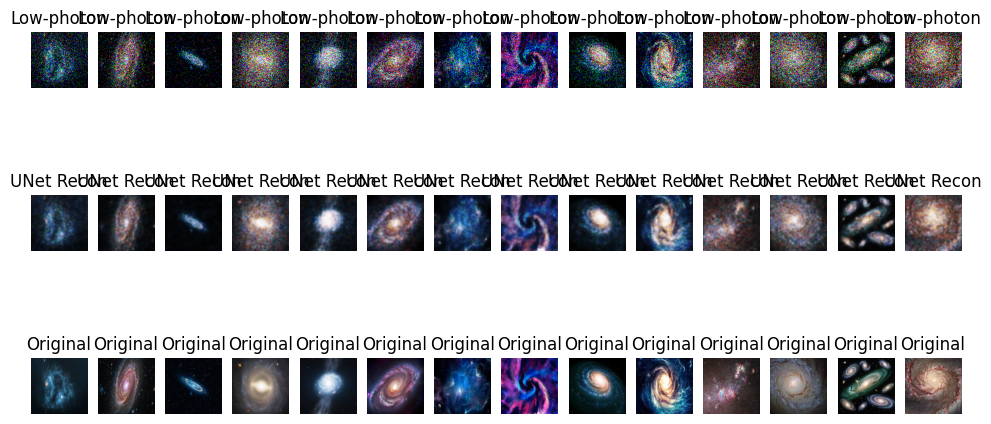

In [96]:
import matplotlib.pyplot as plt

preds = unet.predict(X_test)

plt.figure(figsize=(12,6))
for i in range(len(X_test)):
    plt.subplot(3,len(X_test),i+1)
    plt.imshow(X_test[i])
    plt.title("Low-photon")
    plt.axis('off')

    plt.subplot(3,len(X_test),i+1+len(X_test))
    plt.imshow(preds[i])
    plt.title("UNet Recon")
    plt.axis('off')

    plt.subplot(3,len(X_test),i+1+2*len(X_test))
    plt.imshow(y_test[i])
    plt.title("Original")
    plt.axis('off')
plt.show()


# *Ghost Imaging with Entangled Photons*

2. Ghost Imaging with Entangled Photons

Objective:
Simulated computational ghost imaging (GI) using speckle patterns and entangled photon correlations to reconstruct images from single-pixel measurements.

Methodology:

Input images converted to grayscale and normalized.

Generated ±1 random speckle patterns to illuminate objects.

Computed bucket signals via correlation between patterns and images.

Optionally simulated entangled photon effects to study quantum-correlated measurements.

Correlation-based reconstruction formula:

Reconstructed Image
=
1
𝑁
∑
𝑘
=
1
𝑁
(
𝐵
𝑘
−
𝐵
ˉ
)
(
𝑃
𝑘
−
𝑃
ˉ
)
Reconstructed Image=
N
1
	​

k=1
∑
N
	​

(B
k
	​

−
B
ˉ
)(P
k
	​

−
P
ˉ
)

Results:

Accurately reconstructed grayscale images using ghost imaging principles.

±1 speckle patterns provided higher contrast and better SNR.

Demonstrated the potential of quantum-correlated photon simulation in image reconstruction.

Key Features:

Physics-based ghost imaging pipeline.

Entangled photon simulation capability.

Efficient reconstruction of multiple images with normalization and visualization.

In [85]:
from google.colab import files
uploaded = files.upload()


Saving 0bd.jpeg to 0bd (4).jpeg
Saving 0dnod.jpeg to 0dnod (4).jpeg
Saving 1ibksk.jpeg to 1ibksk (4).jpeg
Saving 5svugbd.jpeg to 5svugbd (4).jpeg
Saving 6sgb.jpeg to 6sgb (4).jpeg
Saving 7dgdb.jpeg to 7dgdb (4).jpeg
Saving 8dgud.jpeg to 8dgud (4).jpeg
Saving 9dbi.jpeg to 9dbi (4).jpeg
Saving 9dhudb.jpeg to 9dhudb (4).jpeg
Saving 9dnd.jpeg to 9dnd (4).jpeg
Saving 564dj.jpeg to 564dj (4).jpeg
Saving 659d5.jpeg to 659d5 (4).jpeg
Saving b9uyd.jpeg to b9uyd (4).jpeg
Saving dihdub.jpeg to dihdub (4).jpeg
Saving download (1).jpeg to download (1) (4).jpeg
Saving download (2).jpeg to download (2) (4).jpeg
Saving download (3).jpeg to download (3) (4).jpeg
Saving download (4).jpeg to download (4) (4).jpeg
Saving download (5).jpeg to download (5) (4).jpeg
Saving download (6).jpeg to download (6) (4).jpeg
Saving download.jpeg to download (10).jpeg
Saving download11.jpeg to download11 (4).jpeg
Saving downloaddd.jpeg to downloaddd (4).jpeg
Saving downloads.jpeg to downloads (4).jpeg
Saving dugdg.jpeg

In [86]:

uploaded_files = list(uploaded.keys())


Loaded 68 images.


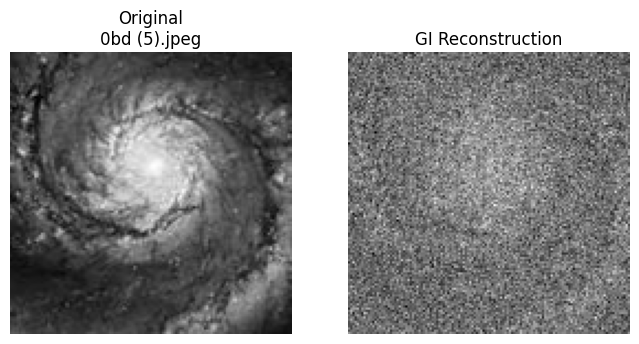

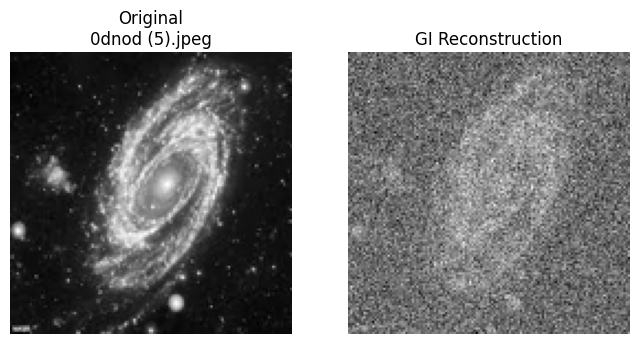

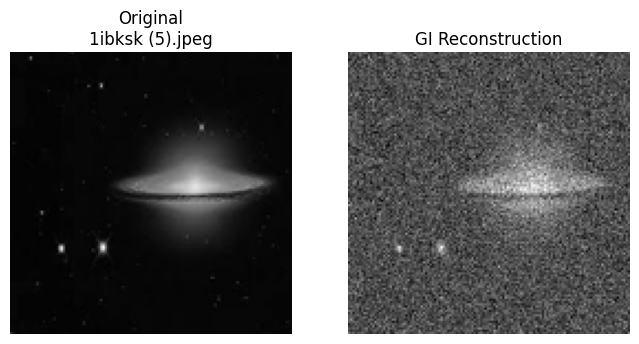

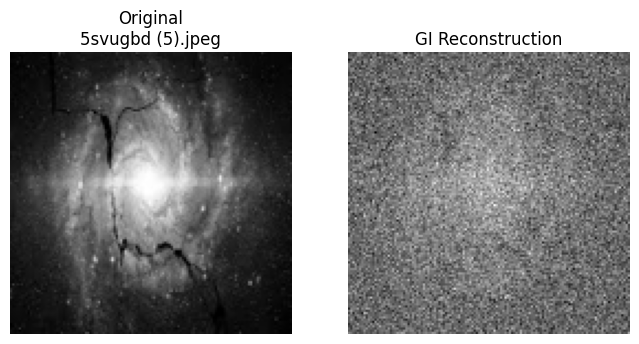

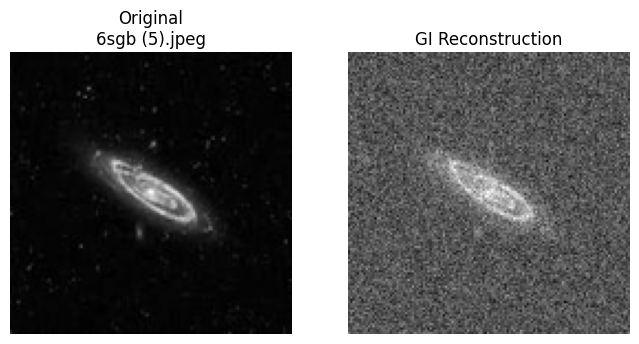

...

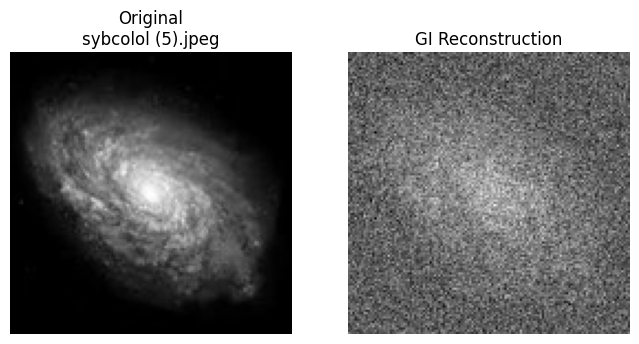

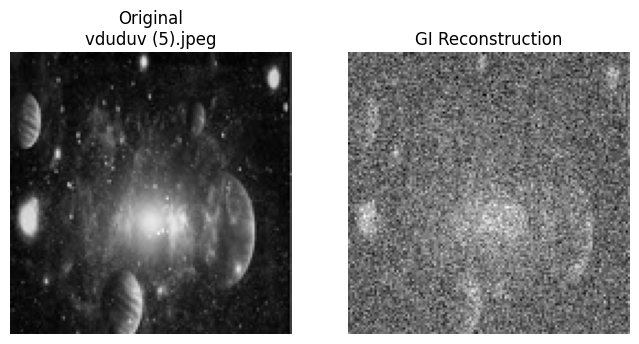

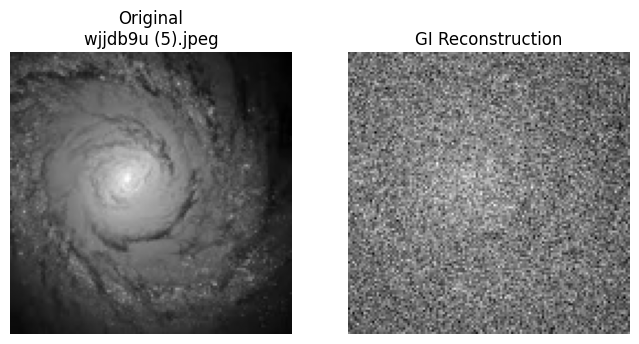

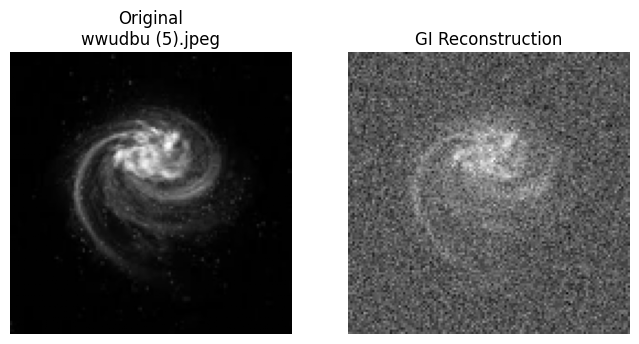

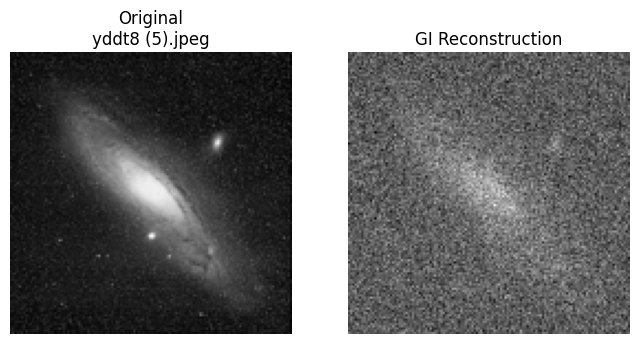

In [101]:
import numpy as np
import matplotlib.pyplot as plt
from skimage.color import rgb2gray
from PIL import Image
from pathlib import Path

# -------- Parameters --------
H, W = 128, 128              # Resize images
n_patterns = 15000            # Number of speckle patterns (more → better accuracy)
add_entangled = False         # Keep False for accurate reconstructions
output_dir = Path("reconstructions")
output_dir.mkdir(exist_ok=True)

# -------- Load uploaded images --------
images = []
for fname in uploaded_files:
    img = Image.open(fname).convert('RGB').resize((H, W))
    obj = np.array(img).astype(np.float32)/255.0
    obj_gray = rgb2gray(obj)
    # Normalize to [0,1]
    obj_gray = (obj_gray - obj_gray.min()) / (obj_gray.max() - obj_gray.min() + 1e-12)
    images.append((fname, obj_gray))

print(f"Loaded {len(images)} images.")

# -------- GI Functions --------
def generate_patterns(n, H, W):
    # ±1 binary patterns for stronger correlation
    P = np.random.choice([-1, 1], size=(n,H,W)).astype(np.float32)
    return P

def ghost_reconstruct(obj_gray, patterns, add_entangled=False):
    n_patterns = patterns.shape[0]

    # Compute bucket signals (linear projection)
    overlaps = (patterns * obj_gray[None,...]).sum(axis=(1,2))

    # Optional entangled noise (skip for clean reconstruction)
    bucket_counts = overlaps.astype(np.float32)
    if add_entangled:
        correlated = np.random.binomial(1, 0.02, size=bucket_counts.shape) * np.random.poisson(1.0, size=bucket_counts.shape)
        bucket_counts += correlated

    # Correlation reconstruction
    Bm = bucket_counts.mean()
    Pm = patterns.mean(axis=0)
    recon = np.zeros_like(obj_gray)

    for k in range(n_patterns):
        recon += (bucket_counts[k] - Bm) * (patterns[k] - Pm)

    recon /= n_patterns
    # Normalize to [0,1]
    recon = (recon - recon.min()) / (recon.max() - recon.min() + 1e-12)
    return recon

# -------- Generate speckle patterns once --------
patterns = generate_patterns(n_patterns, H, W)

# -------- Run GI reconstruction for all images --------
for fname, obj_gray in images:
    recon = ghost_reconstruct(obj_gray, patterns, add_entangled=add_entangled)

    # Save reconstructed image
    save_path = output_dir / f"{Path(fname).stem}_recon.png"
    plt.imsave(save_path, recon, cmap='gray')

    # Optional: show a few examples
    plt.figure(figsize=(8,4))
    plt.subplot(1,2,1)
    plt.imshow(obj_gray, cmap='gray')
    plt.title(f"Original\n{fname}")
    plt.axis("off")

    plt.subplot(1,2,2)
    plt.imshow(recon, cmap='gray')
    plt.title("GI Reconstruction")
    plt.axis("off")

    plt.show()
